In [172]:
# Import libraries
import pandas as pd
import os
from pyspark import SparkContext, SparkConf
from pyspark.sql import SQLContext, SparkSession
from pyspark.sql.types import StructType, StructField, DoubleType, IntegerType, StringType, ArrayType, FloatType
import re
import string
from pyspark.sql.functions import udf, col, size, lit, explode, isnan, when, count, min, max, struct
from pyspark.ml.feature import HashingTF, IDF, Tokenizer, IndexToString, StringIndexer, VectorIndexer, CountVectorizer
from collections import Counter
import networkx as nx
import nltk
from nltk.corpus import words
import gensim
import gensim.corpora as corpora
from gensim.models import CoherenceModel
from gensim.models.ldamulticore import LdaMulticore
import matplotlib.pyplot as plt
%matplotlib inline
import openai
import json
import ast
from igraph import *
import datashader as ds
import datashader.transfer_functions as tf
from datashader.layout import random_layout, circular_layout, forceatlas2_layout
from datashader.bundling import connect_edges, hammer_bundle
pd.set_option("display.max_columns", None)
import tweeters
from pyvis.network import Network

In [2]:
# Initialize spark
sc = SparkContext.getOrCreate(SparkConf().setMaster("local[*]"))
spark = SparkSession.builder.getOrCreate()

22/08/17 12:44:31 WARN Utils: Your hostname, computer resolves to a loopback address: 127.0.1.1; using 192.168.1.159 instead (on interface wlp0s20f3)
22/08/17 12:44:31 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
22/08/17 12:44:31 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
22/08/17 12:44:31 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.
22/08/17 12:44:31 WARN Utils: Service 'SparkUI' could not bind on port 4041. Attempting port 4042.
22/08/17 12:44:31 WARN Utils: Service 'SparkUI' could not bind on port 4042. Attempting port 4043.
22/08/17 12:44:31 WARN Utils: Service 'SparkUI' could not bind on port 4043. Attempting port 4044.
22/08/17 12:4

In [3]:
df = spark.read.json('/home/dataguy/data/us_news_tweets.json')

22/08/17 12:44:40 WARN package: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


In [4]:
df.printSchema()

root
 |-- _type: string (nullable = true)
 |-- cashtags: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- content: string (nullable = true)
 |-- conversationId: long (nullable = true)
 |-- coordinates: struct (nullable = true)
 |    |-- _type: string (nullable = true)
 |    |-- latitude: double (nullable = true)
 |    |-- longitude: double (nullable = true)
 |-- date: string (nullable = true)
 |-- hashtags: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- id: long (nullable = true)
 |-- inReplyToTweetId: long (nullable = true)
 |-- inReplyToUser: struct (nullable = true)
 |    |-- _type: string (nullable = true)
 |    |-- created: string (nullable = true)
 |    |-- description: string (nullable = true)
 |    |-- descriptionUrls: array (nullable = true)
 |    |    |-- element: struct (containsNull = true)
 |    |    |    |-- indices: array (nullable = true)
 |    |    |    |    |-- element: long (containsNull = true)
 |    |    |  

In [5]:
df.count()

2877354

In [6]:
users = df.select('user.*').distinct().toPandas()

In [7]:
# Inspect
min_date, max_date = df.select(min("date"), max("date")).first()
print(f"Min Date- {min_date}")
print(f"Max Date- {max_date}")

Min Date- 2022-01-01T00:00:01+00:00
Max Date- 2022-08-16T10:41:32+00:00


In [8]:
df1 = df.withColumn('username', col('user.username')).withColumn('country', col('place.country')).withColumn('country_cd', col('place.countryCode')).drop('user', 'coordinates', 'place')
df2 = df1.withColumn('quoted', col('quotedTweet.user.username')).drop('quotedTweet').withColumn('mentions', col('mentionedUsers.username')).withColumn('reply_to', col('inReplyToUser.username')).drop('inReplyToUser', 'mentionedUsers', 'renderedContent', 'id', 'media', 'outlinks', '_type', 'cashtags', 'conversationId', 'inReplyToTweetId', 'source', 'sourceUrl', 'sourceLabel', 'tcooutlinks', 'url', 'country', 'lang', 'retweetedTweet')

In [9]:
df2.show(5, False)

+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-------------------------+-------------------------+---------+----------+----------+------------+---------------+----------+------+--------+--------+
|content                                                                                                                                                                                                                                  |date                     |hashtags                 |likeCount|quoteCount|replyCount|retweetCount|username       |country_cd|quoted|mentions|reply_to|
+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [141]:
# Function to get edges
def create_edges(x):
    
    edges = []
    
    if x.quoted is not None:
        
        edges.append((x.username, x.quoted, 'quote'))
        
    if x.mentions is not None:
        
        for i in x.mentions:
            
            edges.append((x.username, i, 'mention'))
        
    if x.reply_to is not None:
        
        edges.append((x.username, x.reply_to, 'reply'))
        
    return edges

In [142]:
edges = df2.rdd.map(lambda x: create_edges(x)).toLocalIterator()
edgs = [i for i in edges if i != []]

In [143]:
for x in edgs:
    
    print(x)

[('E_4_Jupiter', 'Frontex', 'mention')]
[('coryboatright', 'HomeServicesPM', 'mention'), ('coryboatright', 'fortunebuilders', 'mention'), ('coryboatright', 'RoyalNewsfeed', 'mention')]
[('ExecuTeamUSA', 'interney', 'mention'), ('ExecuTeamUSA', 'nbcchicago', 'mention'), ('ExecuTeamUSA', 'craigiskowitz', 'mention')]
[('DHMOban', '9NewsQueensland', 'mention'), ('DHMOban', '9NewsQueensland', 'reply')]
[('LeavSteinberg', 'nj1015', 'mention')]
[('Amysharma77', 'ChandigarhSmart', 'mention'), ('Amysharma77', 'AwesomeChd', 'mention'), ('Amysharma77', 'mwctezpur2020', 'mention'), ('Amysharma77', 'dhumpachika', 'mention'), ('Amysharma77', 'neeza_singh', 'mention')]
[('DHMOban', '9NewsQueensland', 'quote')]
[('LeavSteinberg', 'NBCNews', 'mention')]
[('QuantlabsTech', 'rameeky', 'mention'), ('QuantlabsTech', 'EinDrinkApp', 'mention'), ('QuantlabsTech', 'rdtect', 'mention')]
[('OSSORNUM', 'zlj517', 'quote')]
[('AiThority', 'Yardi', 'mention')]
[('oladeking', 'IRSnews', 'mention'), ('oladeking', 'POT

[('SinPartyMen', 'MrTommyLand', 'mention'), ('SinPartyMen', 'SinPartyLife', 'mention')]
[('inalienblwrites', 'ADL_NYNJ', 'mention'), ('inalienblwrites', 'ADL_NYNJ', 'reply')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('AyasTravelTX', 'usatodaytravel', 'mention'), ('AyasTravelTX', 'NatGeoMag', 'mention'), ('AyasTravelTX', 'TheDIS', 'mention')]
[('Tsunami1618', 'bbcstrictly', 'mention')]
[('Tiffany34006057', 'Tiffany34006057', 'quote')]
[('EnviroEdgeNews', 'SkyNews', 'mention')]
[('lWhitePowerI', 'RepAndyBiggsAZ', 'mention'), ('lWhitePowerI', 'lWhitePowerI', 'reply')]
[('BeenStayin', 'YouTube', 'mention')]
[('HullMaritime', 'HeritageFundNOR', 'mention')]
[('IndiaToday', 'journovidya', 'mention')]
[('darealprisonart', 'TrainorHelen', 'mention'), ('darealprisonart', 'ron_wike', 'mention'), ('darealprisonart', 'LateefMohamme16', 'mention')]
[('EandTmagazine', 'beatrizvalero_', 'mention')]
[('tuesday_only', 'atrupar', 'mention'), ('tuesday_only', 'kilmeade', 'mention'), ('tuesday_o

[('Rodrick76496943', 'SportfusionApps', 'mention')]
[('Rodrick76496943', 'SportfusionApps', 'mention')]
[('NonFungibleNews', 'JimCarrey', 'mention'), ('NonFungibleNews', 'deekaymotion', 'mention')]
[('marylynnbfoster', 'NewsGazette', 'mention'), ('marylynnbfoster', 'wdws1400', 'mention'), ('marylynnbfoster', 'whms975', 'mention')]
[('pu_pulse', 'NitishKumar', 'mention')]
[('therealcomali', 'therealcomali', 'mention')]
[('PublicMediaPMA', 'CPBmedia', 'mention'), ('PublicMediaPMA', 'PublicMediaPMA', 'reply')]
[('exploregh', 'GWSONLINE', 'mention')]
[('mrsocial_news', 'mrsocial_news', 'mention')]
[('Topgoal', 'betr', 'quote'), ('Topgoal', 'betr', 'mention'), ('Topgoal', 'BetcityTv', 'mention'), ('Topgoal', 'Topgoal', 'mention')]
[('Techpressionews', 'Techpressionews', 'mention')]
[('0xMust', 'BalouBAYC', 'mention'), ('0xMust', 'elonmusk', 'mention'), ('0xMust', 'BalouBAYC', 'reply')]
[('WeCapisco', 'WeCapisco', 'mention')]
[('HENI', 'cryptopunksnfts', 'mention'), ('HENI', 'yugalabs', 'men

[('AseanNewsToday', 'AseanNewsToday', 'mention')]
[('MikeTalks', 'spreaker', 'mention')]
[('BestTLD', 'FremontCyril', 'quote')]
[('wyzthofficial', 'officialwyzth', 'mention')]
[('Randbreloaded', 'Randbreloaded', 'mention')]
[('Othershawnlong', 'xdadevelopers', 'mention')]
[('OmajemiteD', 'ejesgist', 'mention')]
[('ejesgist', 'ejesgist', 'mention')]
[('RafaelSalazar20', 'grindfacetv_', 'quote')]
[('mid_day', 'MasabaG', 'mention')]
[('THEFREEMEDIA2K', 'CoxEnterprises', 'mention')]
[('DigitalMehmet', 'Vocal_Creators', 'mention')]
[('4TheRecordUK', 'amnestyusa', 'mention'), ('4TheRecordUK', 'amnesty', 'mention'), ('4TheRecordUK', 'AmnestyUK', 'mention'), ('4TheRecordUK', 'Amnesty_UA', 'mention')]
[('RailTalent', 'easyhotels', 'mention'), ('RailTalent', 'Telegraph', 'mention'), ('RailTalent', 'DailyMirror', 'mention'), ('RailTalent', 'DailyMailUK', 'mention'), ('RailTalent', 'SunNews', 'mention'), ('RailTalent', 'guardian', 'mention'), ('RailTalent', 'GuardianNews24', 'mention'), ('RailTale

[('AseanNewsToday', 'AseanNewsToday', 'mention')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('pablolarah', 'codrops', 'mention'), ('pablolarah', 'jh3yy', 'mention'), ('pablolarah', 'Anemolito', 'mention'), ('pablolarah', 'Svelvet_OSLabs', 'mention'), ('pablolarah', 'bramus', 'mention'), ('pablolarah', 'davidbaron', 'mention'), ('pablolarah', 'Andersonmancini', 'mention')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('oskool_g', 'blueisviolet', 'mention'), ('oskool_g', 'purexbox', 'mention')]
[('Bambi_soju', 'Reikilass', 'quote')]
[('HouseofColors_', 'theriotoc', 'mention'), ('HouseofColors_', 'ChefTrez__', 'mention'), ('HouseofColors_', 'swamp843', 'mention'), ('HouseofColors_', 'bigGeechiMbb', 'mention'), ('HouseofColors_', 'kevinparx', 'mention'), ('HouseofColors_', 'RuinYourDayNow', 'mention')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cybera

[('mtlgazette', 'nationalpost', 'mention')]
[('edmontonjournal', 'nationalpost', 'mention')]
[('OttawaCitizen', 'nationalpost', 'mention')]
[('VancouverSun', 'nationalpost', 'mention')]
[('leaderpost', 'nationalpost', 'mention')]
[('ejesgist', 'ejesgist', 'mention')]
[('shinils', 'shinils', 'reply')]
[('TheWindsorStar', 'nationalpost', 'mention')]
[('LFPress', 'nationalpost', 'mention')]
[('EutherPendragon', 'WashTimes', 'mention')]
[('nationalpost', 'nationalpost', 'mention')]
[('EvHarrogate', 'SpotifyUK', 'mention'), ('EvHarrogate', 'applepodcast247', 'mention'), ('EvHarrogate', 'ApplePodcasts', 'mention'), ('EvHarrogate', 'PodcastsGoogle', 'mention'), ('EvHarrogate', 'OvercastFM', 'mention'), ('EvHarrogate', 'AmazonMusicUK', 'mention'), ('EvHarrogate', 'Castbox_fm', 'mention'), ('EvHarrogate', 'pocketcasts', 'mention'), ('EvHarrogate', 'Stitcher', 'mention'), ('EvHarrogate', 'gaana', 'mention'), ('EvHarrogate', 'castrepublic', 'mention'), ('EvHarrogate', 'audibleuk', 'mention'), ('E

[('cyberalgo', 'cyberalgo', 'reply')]
[('AimPublicity', 'NationalWorld', 'mention')]
[('seatodaynews', 'seatodaynews', 'mention')]
[('StartupsReal', 'CaraveloTech', 'mention')]
[('ecommerce_picks', 'eBay_UK', 'mention')]
[('HellBoy4666', 'HellBoy4666', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('kwalis6294', 'kwalis6294', 'quote'), ('kwalis6294', 'NuZuDu', 'mention'), ('kwalis6294', 'NuZuDu', 'mention'), ('kwalis6294', 'Bitboy_Crypto', 'mention'), ('kwalis6294', 'kwalis6294', 'mention')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('cyberalgo', 'cy

[('AGheyn', 'Internazionale', 'mention')]
[('JustinFREAKINS', 'charliekirk11', 'mention'), ('JustinFREAKINS', 'TPUSA', 'mention')]
[('SoftwareONE', 'Microsoft', 'mention'), ('SoftwareONE', 'Oracle', 'mention'), ('SoftwareONE', 'Azure', 'mention'), ('SoftwareONE', 'OracleDatabase', 'mention'), ('SoftwareONE', 'msPartner', 'mention')]
[('Eyebee', 'SalmanShaheen', 'mention')]
[('AZoLifeSciences', 'UniMelb', 'mention')]
[('TheWhiskyBiz', 'DrinkGlenturret', 'mention')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('NewsMagnify1', 'DrBharatippawar', 'mention')]
[('anteggs49', 'recycledtwice', 'mention'), ('anteggs49', 'PascalR57', 'mention'), ('anteggs49', 'recycledtwice', 'reply')]
[('AiThority', 'apromore_bpm', 'mention')]
[('AiThority', 'Wolters_Kluwer', 'mention')]
[('AiThority', 'PicsartStudio', 'mention')]
[('AiThority', 'RollWorks', 'mention')]
[('ProlificNorth', 'MoJGovUK', 'mention')]
[('pu_pulse', 'trafficchd', 'mention')]
[('yash34098500', 'FordIndiaHelp', 'mention'), ('yas

[('cyberalgo', 'cyberalgo', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('RADMagazine', 'MRSAFETYMATTERS', 'mention')]
[('capacitymedia', 'Google', 'mention'), ('capacitymedia', 'googlecloud', 'mention'), ('capacitymedia', 'nitnat1989', 'mention')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('ParentsBabyExpo', 'RosemaryConnors', 'mention'), ('ParentsBabyExpo', 'NBCPhiladelphia', 'mention')]
[('LivePretoria', 'Min_JCS', 'mention'), ('LivePretoria', 'LivePretoria', 'mention')]
[('JBLEWIS1983', 'nowjazznow', 'mention')]
[('laitavalenzuela', 'ntvnewszero', 'mention'), ('laitavalenzuela', 'ntvnewszero', 'reply')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('VladimirRadu_R', 'BitcoinMagazine', 'quote')]
[('capacitymedia', 'Rogers', 'mention'), ('capacitymedia', 'saf_malik', 'mention')]
[('PoseidonTPA', 'PoseidonTPA', 'mention')]
[('natlawreview', 'NatLawEmployer', 'mention'), ('natlawreview', 'SHRMHRNews', 'mention')]
[('capacitymedia', 'Telefonica_En', 'mention'), ('capacitymedia', 'CA_Assuran

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[('hensleragency', 'nytimes', 'mention')]
[('hensleragency', 'nytimes', 'mention')]
[('hensleragency', 'nytimes', 'mention')]
[('MettisGlobal', 'MiftahIsmail', 'mention')]
[('ChimpReports', 'UNDAuthority', 'mention'), ('ChimpReports', 'MinofHealthUG', 'mention')]
[('MirrorNow', 'radhika1705', 'mention')]
[('Randbreloaded', 'Randbreloaded', 'mention')]
[('Pratiks37206006', 'Pratiks37206006', 'mention'), ('Pratiks37206006', 'KlussterApp', 'mention')]
[('Randbreloaded', 'Randbreloaded', 'mention')]
[('dt_next', 'dinathanthi', 'mention')]
[('YMcTier', 'YMcTier', 'mention')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('CompChemNewsBot', 'aritraroy24', 'mention')]
[('NewsNowNation', 'GauravVirendraA', 'mention'), ('NewsNowNation', 'deepikapadukone', 'mention'), ('NewsNowNation', 'DeepikaPFC', 'mention'), ('NewsNowNation', 'deepikaddicts', 'mention')]
[('ManaTelanganaIN', 'telangana', 'mention')]
[('ChimpReports', 'dbahati', 'mention'), ('ChimpReports', 'mtic_uganda', 'mention')]
[('

[('W_Deloreanpod', 'spreaker', 'mention')]
[('NewsNowNation', 'GauravVirendraA', 'mention')]
[('Magadh_Capital', 'Magadh_Capital', 'reply')]
[('projects_today', 'projects_today', 'mention'), ('projects_today', 'PMOIndia', 'mention'), ('projects_today', 'narendramodi', 'mention'), ('projects_today', 'CMOfficeUP', 'mention')]
[('cyberalgo', 'cyberalgo', 'reply')]
[('GeorgiaOnline1', 'GeorgiaOnline1', 'mention')]
[('METROPEOPLE1', 'mkstalin', 'mention'), ('METROPEOPLE1', 'tndwwa', 'mention'), ('METROPEOPLE1', 'TNDIPRNEWS', 'mention'), ('METROPEOPLE1', 'kaizensukumar', 'mention'), ('METROPEOPLE1', 'BalakrishnanCSR', 'mention'), ('METROPEOPLE1', 'CMOTamilnadu', 'mention'), ('METROPEOPLE1', 'DMKITwing', 'mention'), ('METROPEOPLE1', 'chennaicorp', 'mention')]
[('samtesla7', 'zomato', 'mention'), ('samtesla7', 'letsblinkit', 'mention'), ('samtesla7', 'NSEIndia', 'mention'), ('samtesla7', 'BSEIndia', 'mention'), ('samtesla7', 'SEBI_India', 'mention'), ('samtesla7', 'ZeeBusiness', 'mention'), ('

[('sgbrenner', 'MicrowavesRF', 'mention'), ('sgbrenner', 'MathWorks', 'mention')]
[('RockCheetah', 'phocuswire', 'mention')]
[('orgasmetron', 'ghazalawahab', 'mention'), ('orgasmetron', 'ghazalawahab', 'reply')]
[('ParoxysmLtd', 'ParoxysmLtd', 'mention')]
[('bikeindia', 'royalenfield', 'mention')]
[('AfricaFoodSafe', 'SONNigeria', 'mention')]
[('PhDAeroUC3M', 'uc3m_aero', 'mention'), ('PhDAeroUC3M', 'uc3m', 'mention'), ('PhDAeroUC3M', 'EPS_UC3M', 'mention'), ('PhDAeroUC3M', 'ETPACK1', 'mention'), ('PhDAeroUC3M', 'master_uc3m', 'mention')]
[('RADMagazine', 'CanonMedicalEU', 'mention'), ('RADMagazine', 'CanonMedical', 'mention'), ('RADMagazine', 'birminghamcg22', 'mention'), ('RADMagazine', 'tessasanderson', 'mention')]
[('Foxmental_X', 'washingtonpost', 'mention')]
[('marketers_coop', 'coopnews', 'mention'), ('marketers_coop', 'ScotEntNews', 'mention')]
[('E_4_Jupiter', 'Kaminski_M_', 'mention'), ('E_4_Jupiter', 'ZiobroPL', 'mention'), ('E_4_Jupiter', 'EU_Justice', 'mention'), ('E_4_Jup

[('theluckyman', 'Fresh_HipHopRnB', 'mention')]
[('Crypt0Give_away', 'POTUS', 'mention')]
[('SideoTV', 'NewsFlashSD', 'mention')]
[('AdivinaCuantos', 'Cinemascomics', 'mention')]
[('imconservative', 'realDailyWire', 'mention'), ('imconservative', 'michaeljknowles', 'mention')]
[('rbhcom20', 'rbhcom20', 'mention')]
[('DaveLapell', 'GovKathyHochul', 'mention'), ('DaveLapell', 'EliseStefanik', 'mention'), ('DaveLapell', 'fud31', 'mention'), ('DaveLapell', 'Degrasse81', 'mention')]
[('rbhcom20', 'rbhcom20', 'mention')]
[('rbhcom20', 'rbhcom20', 'mention')]
[('rbhcom20', 'rbhcom20', 'mention')]
[('rbhcom20', 'rbhcom20', 'mention')]
[('ForemanLLC', 'spreaker', 'mention')]
[('Jameses797', 'YouTube', 'mention')]
[('lifeazul', 'JoeyMacHockey', 'quote'), ('lifeazul', 'NHL', 'mention'), ('lifeazul', 'NHLBruins', 'mention'), ('lifeazul', 'KathrynTappen', 'mention')]
[('lifeazul', 'JoeyMacHockey', 'mention'), ('lifeazul', 'NHL', 'mention'), ('lifeazul', 'NHLBruins', 'mention'), ('lifeazul', 'Kathry

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[('jimallthetime', 'NewYorker', 'mention')]
[('EvHarrogate', 'SpotifyUK', 'mention'), ('EvHarrogate', 'applepodcast247', 'mention'), ('EvHarrogate', 'ApplePodcasts', 'mention'), ('EvHarrogate', 'PodcastsGoogle', 'mention'), ('EvHarrogate', 'OvercastFM', 'mention'), ('EvHarrogate', 'AmazonMusicUK', 'mention'), ('EvHarrogate', 'Castbox_fm', 'mention'), ('EvHarrogate', 'pocketcasts', 'mention'), ('EvHarrogate', 'RadioPublic', 'mention'), ('EvHarrogate', 'Stitcher', 'mention'), ('EvHarrogate', 'gaana', 'mention'), ('EvHarrogate', 'castrepublic', 'mention'), ('EvHarrogate', 'audibleuk', 'mention'), ('EvHarrogate', 'Deezer', 'mention'), ('EvHarrogate', 'PodcastAddict', 'mention')]
[('24Writeups', 'markbrantley3', 'mention')]
[('punkrockblog', 'MAIN_LINE_10', 'mention'), ('punkrockblog', 'skaprecords', 'mention')]
[('Connects_Africa', 'Macrocomm_sa', 'mention'), ('Connects_Africa', 'BoschAfrica', 'mention')]
[('MUSASIZIMOSESM4', 'thevenusmedia', 'mention')]
[('thehindupatrika', 'TheNileshDesa

[('shaitanik_verse', 'ESPNFC', 'mention')]
[('vilradio', 'YouTube', 'mention')]
[('vilradio', 'YouTube', 'mention')]
[('TGWestminster', '_JamesGilboy', 'mention'), ('TGWestminster', 'PakistanNewsUpd', 'mention'), ('TGWestminster', 'afpbhatti', 'mention')]
[('IndiaToday', 'sushantsareen', 'mention')]
[('projects_today', 'UltraTechCement', 'mention'), ('projects_today', 'projects_today', 'mention'), ('projects_today', 'AdityaBirlaGrp', 'mention')]
[('surfshark', 'surfshark', 'reply')]
[('CHNSci', 'cell_res', 'mention'), ('CHNSci', 'CHNSci', 'mention')]
[('fanmedianews', 'fanmedianews', 'mention')]
[('AyrshireChamber', 'fire_scot', 'mention')]
[('punkrockblog', 'buck09', 'mention'), ('punkrockblog', 'CleopatraRecord', 'mention')]
[('ecommerce_picks', 'eBay_UK', 'mention')]
[('janbhawana', 'akshaykumar', 'mention'), ('janbhawana', 'janbhawana', 'mention')]
[('Detechtors_', 'XiaomiIndia', 'mention'), ('Detechtors_', 'manukumarjain', 'mention'), ('Detechtors_', 'Xiaomi', 'mention'), ('Detech

[('iAssets_org', 'iAssets_org', 'quote')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('EvHarrogate', 'SpotifyUK', 'mention'), ('EvHarrogate', 'applepodcast247', 'mention'), ('EvHarrogate', 'ApplePodcasts', 'mention'), ('EvHarrogate', 'PodcastsGoogle', 'mention'), ('EvHarrogate', 'OvercastFM', 'mention'), ('EvHarrogate', 'AmazonMusicUK', 'mention'), ('EvHarrogate', 'Castbox_fm', 'mention'), ('EvHarrogate', 'pocketcasts', 'mention'), ('EvHarrogate', 'RadioPublic', 'mention'), ('EvHarrogate', 'Stitcher', 'mention'), ('EvHarrogate', 'gaana', 'mention'), ('EvHarrogate', 'castrepublic', 'mention'), ('EvHarrogate', 'audibleuk', 'mention'), ('EvHarrogate', 'Deezer', 'mention'), ('EvHarrogate', 'PodcastAddict', 'mention')]
[('dayashappiness_', 'Zendaya', 'mention')]
[('TheEnvoyWeb', 'netflix', 'mention')]
[('iAssets_org', 'iAssets_org', 'quote')]
[('Waconzy', 'Waconzy', 'mention')]
[('MrBreakouts', 'krusty900', 'quote')]
[('iAssets_org', 'iAssets_org', 'quote')]
[('GiGiCaponePR', 'Comp

[('PEGASUSEB777', 'NahBabeeNah', 'mention'), ('PEGASUSEB777', 'NahBabeeNah', 'reply')]
[('PoseidonTPA', 'PoseidonTPA', 'mention')]
[('LawExchangeInt', 'HoldingRedlich', 'mention')]
[('usa_feeds', 'usa_feeds', 'mention')]
[('DA_Politics', 'IREHR', 'mention')]
[('TheHTAfrica', 'GEJonathan', 'mention'), ('TheHTAfrica', 'nassnigeria', 'mention')]
[('1AmericanGirl', 'FoxNews', 'mention')]
[('Indiana_EDC', 'McLarenF1', 'mention'), ('Indiana_EDC', 'ZBrownCEO', 'mention')]
[('echonewsug', 'NRMOnline', 'mention'), ('echonewsug', 'KagutaMuseveni', 'mention')]
[('pridemagng', 'OkonLagos', 'mention')]
[('TGWestminster', 'MilitaryTimes', 'mention'), ('TGWestminster', 'Chris_1791', 'mention'), ('TGWestminster', 'lucianosanjua', 'mention')]
[('DA_Politics', 'GovWhitmer', 'mention')]
[('BitcoinToSaveUs', 'FPeople27', 'mention'), ('BitcoinToSaveUs', 'RepNancyMace', 'mention'), ('BitcoinToSaveUs', 'nayibbukele', 'mention'), ('BitcoinToSaveUs', 'FPeople27', 'reply')]
[('CCPaceInc', 'LinkedIn', 'mention')

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[('Foxmental_X', 'TIME', 'mention')]
[('WcsDe', 'YouTube', 'mention')]
[('EconomySquare', 'CraftyFin', 'mention')]
[('BeauCarew', 'YouTube', 'mention'), ('BeauCarew', 'MainelyMandy', 'mention')]
[('DAYLEE', 'amplifyforgood', 'mention'), ('DAYLEE', 'ArcanaDogs', 'mention'), ('DAYLEE', 'AnubisSekhmet', 'mention'), ('DAYLEE', 'AndyWeprin', 'mention'), ('DAYLEE', 'Christinamayn1', 'mention'), ('DAYLEE', 'P4animalsR', 'mention'), ('DAYLEE', 'NYCMayor', 'mention'), ('DAYLEE', 'mayorsCAU', 'mention'), ('DAYLEE', 'FDNY', 'mention'), ('DAYLEE', 'NYPDnews', 'mention'), ('DAYLEE', 'LovinIt100', 'mention'), ('DAYLEE', 'adrianashby', 'mention'), ('DAYLEE', 'ckarr2', 'mention'), ('DAYLEE', 'CeeLyn15', 'mention'), ('DAYLEE', 'the_little_chis', 'mention'), ('DAYLEE', 'NMBewitched', 'mention'), ('DAYLEE', 'Mygreatredmare', 'mention'), ('DAYLEE', 'LeenaMariaAula', 'mention'), ('DAYLEE', 'sdaly555', 'mention'), ('DAYLEE', 'PhaedraXTeddy', 'mention'), ('DAYLEE', 'venetianblonde', 'mention'), ('DAYLEE', '

[('AiThority', 'Memfault', 'mention')]
[('linstark6', 'cnnbrk', 'mention'), ('linstark6', 'BBCBreaking', 'mention'), ('linstark6', 'BBCWorld', 'mention'), ('linstark6', 'BBCNews', 'mention'), ('linstark6', 'FoxNews', 'mention'), ('linstark6', 'MSNBC', 'mention'), ('linstark6', 'ABC', 'mention')]
[('BUSINESSFIRSTAM', 'DiscipleofTrend', 'mention')]
[('pbtweeter', 'spreaker', 'mention')]
[('e3radio', 'AnnaDeShawn', 'mention'), ('e3radio', 'Cruising_Pod', 'mention'), ('e3radio', 'BKLYNlibrary', 'mention'), ('e3radio', 'SaucySantana_', 'mention'), ('e3radio', 'breakfastclubam', 'mention')]
[('VetsAddressing', 'starsandstripes', 'mention'), ('VetsAddressing', 'Blondhorsecrazy', 'mention')]
[('rebel4life2020', 'TheJusticeDept', 'mention'), ('rebel4life2020', 'UNHumanRights', 'mention'), ('rebel4life2020', 'amnestyusa', 'mention')]
[('BioForward', 'Morgridge_Inst', 'mention')]
[('thefirstindia', 'narendramodi', 'mention'), ('thefirstindia', 'PMOIndia', 'mention')]
[('thehindupatrika', 'TheNile

[('LivePretoria', 'LivePretoria', 'mention')]
[('corman97835391', 'EstergrenSue', 'quote')]
[('Bronxvoice1', 'NYPDTips', 'mention'), ('Bronxvoice1', 'crimeonlinenews', 'mention'), ('Bronxvoice1', 'Retweet_Twitch', 'mention'), ('Bronxvoice1', 'Twitch', 'mention'), ('Bronxvoice1', 'caughtonvideos', 'mention')]
[('LiveMoneyMgMt1', 'theestallion', 'mention'), ('LiveMoneyMgMt1', 'torylanez', 'mention'), ('LiveMoneyMgMt1', 'Akademiks', 'mention')]
[('TaxPoetic', 'UAHuntsville', 'mention'), ('TaxPoetic', 'artshuntsville', 'mention')]
[('UnrealCapital', 'MetaSpetsGame', 'mention')]
[('OneidaShark', 'georgesoros', 'mention'), ('OneidaShark', 'CNN', 'mention'), ('OneidaShark', 'FoxNews', 'mention'), ('OneidaShark', 'USATODAY', 'mention'), ('OneidaShark', 'nbcwashington', 'mention'), ('OneidaShark', 'FBI', 'mention')]
[('bountyofbeads2', 'tsnua', 'quote')]
[('etribune', 'etribune', 'reply')]
[('AJ_Bingham', 'binghamgp', 'mention')]
[('AiThority', 'smithsdetection', 'mention')]
[('carlorion', 'Spa

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[('nelo_simon', 'TwitterComms', 'mention'), ('nelo_simon', 'TwitterBlue', 'mention'), ('nelo_simon', 'TwitterComms', 'reply')]
[('Othershawnlong', 'xdadevelopers', 'mention')]
[('TheWindsorStar', 'TheGrowthOp', 'mention')]
[('paeznyc', 'TechWontWork', 'mention')]
[('radio_marino', 'wbtradio', 'mention')]
[('Crypto_Oracles_', 'Strike', 'mention'), ('Crypto_Oracles_', 'Strike', 'mention')]
[('paeznyc', 'TechWontWork', 'mention')]
[('theluckyman', 'Fresh_HipHopRnB', 'mention')]
[('zborkena', 'zborkena', 'mention')]
[('VDFromAToZ', 'ABC', 'mention'), ('VDFromAToZ', 'GMA', 'mention'), ('VDFromAToZ', 'RobinRoberts', 'mention'), ('VDFromAToZ', 'PerezHilton', 'mention'), ('VDFromAToZ', 'ThePerezHilton', 'mention'), ('VDFromAToZ', 'ChrisConnelly', 'mention')]
[('leaderpost', 'TheGrowthOp', 'mention')]
[('theluckyman', 'Fresh_HipHopRnB', 'mention')]
[('NAITNewsWatch', 'JasonCoppingAB', 'mention')]
[('VancouverSun', 'TheGrowthOp', 'mention')]
[('andersonmmusic', 'YouTube', 'mention'), ('andersonm

[('CANWEPLEASTALK', 'FoxNews', 'mention'), ('CANWEPLEASTALK', 'TreyYingst', 'mention')]
[('_casinoreviews', 'BlueprintGaming', 'mention')]
[('GiGiCaponePR', 'Complex', 'mention')]
[('AbboudAchille', 'imago_images', 'mention')]
[('RynRobrtsRealtr', 'Southern_Living', 'mention')]
[('77WABCradio', 'BillOReilly', 'mention')]
[('LegalNewsHQ', 'EHRCwales', 'mention')]
[('Innov_Inf', 'Nature', 'mention'), ('Innov_Inf', 'NatureComms', 'mention'), ('Innov_Inf', 'The_InnovationJ', 'mention'), ('Innov_Inf', 'YangLiu_CTH', 'mention')]
[('WCCBCharlotte', 'LiveNation', 'mention')]
[('cRs727', 'Mollyploofkins', 'mention'), ('cRs727', 'Twitter', 'mention'), ('cRs727', 'Mollyploofkins', 'reply')]
[('jjasportstudio', 'wilfriedzaha', 'mention')]
[('GLOBAL_BIHARI', 'UNEP', 'mention')]
[('dee4peace', 'ShanghaiEye', 'mention'), ('dee4peace', 'YouTube', 'mention')]
[('gl0bal_feed', 'NBCNewsTech', 'mention')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('carthrust', 'Honda', 'mention')]
[('AlexusVDavi

[('BonnieSilkman', 'fox12oregon', 'mention')]
[('OttawaNewsPulse', 'OttawaNewsPulse', 'mention')]
[('OttawaNewsPulse', 'OttawaNewsPulse', 'mention')]
[('OttawaNewsPulse', 'OttawaNewsPulse', 'mention')]
[('OttawaNewsPulse', 'OttawaNewsPulse', 'mention')]
[('OttawaNewsPulse', 'OttawaNewsPulse', 'mention')]
[('Innov_Inf', 'thenextweb', 'mention'), ('Innov_Inf', 'fei_ict', 'mention')]
[('GiGiCaponePR', 'Complex', 'mention')]
[('LiamGarrityKY3', 'kytv', 'mention')]
[('Innov_Inf', 'thenextweb', 'mention'), ('Innov_Inf', 'fei_ict', 'mention')]
[('nationalpost', 'TheGrowthOp', 'mention')]
[('Innov_Inf', 'thenextweb', 'mention'), ('Innov_Inf', 'fei_ict', 'mention')]
[('Innov_Inf', 'thenextweb', 'mention'), ('Innov_Inf', 'fei_ict', 'mention')]
[('media_radiance', 'NITIAayog', 'mention'), ('media_radiance', 'amitabhk87', 'mention')]
[('justpersnickety', 'TeriRobins2', 'mention'), ('justpersnickety', 'justpersnickety', 'reply')]
[('BisnisDea', 'YouTube', 'mention')]
[('justpersnickety', 'TeriRobin

[('jc_vazquez', 'tkothari', 'mention'), ('jc_vazquez', 'AttivoNetworks', 'mention'), ('jc_vazquez', 'forgepointcap', 'mention')]
[('retafrica_', 'YouTube', 'mention')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('MariaBartiromo', 'MorningsMaria', 'mention'), ('MariaBartiromo', 'FoxBusiness', 'mention'), ('MariaBartiromo', 'GETTRofficial', 'mention'), ('MariaBartiromo', 'JasonMillerinDC', 'mention')]
[('Othershawnlong', 'xdadevelopers', 'mention')]
[('pubrooms', 'CLHNews', 'mention')]
[('TatianaBarring1', '_GlobalCrisis_', 'quote'), ('TatianaBarring1', 'CreativeScty', 'mention'), ('TatianaBarring1', '_GlobalCrisis_', 'mention')]
[('LexterzOfficial', 'moefcc', 'mention')]
[('AMAD18', 'JohnKingCNN', 'mention')]
[('cgbattlehub', 'Playkey_EN', 'mention'), ('cgbattlehub', 'maximumsettings', 'mention'), ('cgbattlehub', 'Battlefield', 'mention'), ('cgbattlehub', 'Battlefield2042', 'mention')]
[('buckfynn', 'amlookout', 'mention')]
[('_casinoreviews', 'blackstone', 'mention'), ('_casin

[('JamiroFan2000', 'JamiroquaiHQ', 'mention'), ('JamiroFan2000', 'Jamiroquaifans1', 'mention')]
[('DJFunkyGrrL', 'DJFunkyGrrL', 'reply')]
[('JamiroFan2000', 'JamiroquaiHQ', 'mention'), ('JamiroFan2000', 'Jamiroquaifans1', 'mention')]
[('JamiroFan2000', 'JamiroquaiHQ', 'mention'), ('JamiroFan2000', 'Jamiroquaifans1', 'mention')]
[('JamiroFan2000', 'JamiroquaiHQ', 'mention'), ('JamiroFan2000', 'Jamiroquaifans1', 'mention')]
[('JamiroFan2000', 'JamiroquaiHQ', 'mention'), ('JamiroFan2000', 'Jamiroquaifans1', 'mention')]
[('JamiroFan2000', 'JamiroquaiHQ', 'mention'), ('JamiroFan2000', 'Jamiroquaifans1', 'mention')]
[('fpjindia', 'SanjayJog7', 'mention'), ('fpjindia', 'mybmc', 'mention'), ('fpjindia', 'Dev_Fadnavis', 'mention'), ('fpjindia', 'ShivSena', 'mention'), ('fpjindia', 'NCPspeaks', 'mention'), ('fpjindia', 'INCIndia', 'mention'), ('fpjindia', 'OfficeofUT', 'mention')]
[('Tiffany34006057', 'grizzlygisela', 'quote')]
[('EconomySquare', 'CraftyFin', 'mention')]
[('Ralphtan222', 'itmedi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[('KinesisMonetary', 'andrewmaguire1', 'mention')]
[('morningkashmir', 'PMOIndia', 'mention')]
[('KoryK100', 'KoryK100', 'mention')]
[('carlspaceness', 'stillgray', 'quote')]
[('ALACommunity', 'demuromarquez', 'mention'), ('ALACommunity', 'AquiaSolutions', 'mention'), ('ALACommunity', 'TSPsmart', 'mention')]
[('theluckyman', 'Fresh_HipHopRnB', 'mention')]
[('Othershawnlong', 'xdadevelopers', 'mention')]
[('DAYLEE', 'NMBewitched', 'quote'), ('DAYLEE', 'HumaneSociety', 'mention')]
[('DataLawCanada', 'Aust_Parliament', 'mention'), ('DataLawCanada', 'DataLawCanada', 'reply')]
[('Arttizens_2022', 'Cointelegraph', 'mention')]
[('Midu_Life', 'TheHurricaneDu', 'mention')]
[('Lodge20201', 'POTUS', 'mention')]
[('Olicanarama', 'BorisJohnson', 'mention'), ('Olicanarama', 'NadineDorries', 'mention')]
[('_casinoreviews', 'irondogstudio', 'mention')]
[('Stevenfr3shh', 'fcsm_eng', 'quote')]
[('AcidCentral', 'Bandcamp', 'mention'), ('AcidCentral', 'EpicGames', 'mention')]
[('barelykind', 'DiscussingF

[('jc_vazquez', 'SCMagazine', 'mention')]
[('AgapeBoysRanch', 'BUniverse004', 'quote')]
[('ele_hlm_tattoo', 'VladElEmpalador', 'quote')]
[('jeremyhawkins99', 'NewshubPolitics', 'quote')]
[('SebWrites', 'RT_com', 'mention'), ('SebWrites', 'SebWrites', 'reply')]
[('FakeNews_FC_NFT', 'YouTube', 'mention')]
[('Jessica_L_Hunt', 'baltimoresun', 'mention')]
[('AgapeBoysRanch', 'RepKeriIngle', 'mention'), ('AgapeBoysRanch', 'piper4missouri', 'mention'), ('AgapeBoysRanch', 'LucasKunceMO', 'mention'), ('AgapeBoysRanch', 'AGEricSchmitt', 'mention'), ('AgapeBoysRanch', 'ParisHilton', 'mention'), ('AgapeBoysRanch', 'judylthomas', 'mention'), ('AgapeBoysRanch', 'GovParsonMO', 'mention'), ('AgapeBoysRanch', 'EnglishTeach07', 'mention'), ('AgapeBoysRanch', 'APNews', 'mention')]
[('gl0bal_feed', 'newsmax', 'mention')]
[('PolashKhan9393', 'CNN', 'mention')]
[('OttawaCitizen', 'TheGrowthOp', 'mention')]
[('cryptohuahua', 'Earthcitizen8', 'quote')]
[('PAFreePress', 'SantaClaraDA', 'mention'), ('PAFreePres

[('WorldWater_News', 'googlenews', 'mention')]
[('DiabeticCyborgg', 'ringer', 'mention')]
[('Marathon_85', 'YouTube', 'mention'), ('Marathon_85', 'theretweetermag', 'mention'), ('Marathon_85', 'ITHERETWEETER1', 'mention')]
[('IntuitiveAICODE', 'realalexvieira', 'mention')]
[('DiabeticCyborgg', 'ringer', 'mention')]
[('jkcrimewatch', 'PoonchDm', 'mention')]
[('OmajemiteD', 'ejesgist', 'mention')]
[('ejesgist', 'ejesgist', 'mention')]
[('dilagrafie', 'dilagrafie', 'mention')]
[('sssc', 'sssc', 'quote')]
[('Jake33076', 'amlookout', 'mention')]
[('nvragainamerica', 'TeamTrump', 'mention')]
[('_casinoreviews', 'PlayUp_US', 'mention'), ('_casinoreviews', 'WestsTigers', 'mention')]
[('TheDailySledge', 'WboolStandard', 'mention'), ('TheDailySledge', 'HughMunro16', 'mention'), ('TheDailySledge', 'FOXFOOTY', 'mention')]
[('gl0bal_feed', 'NBCNews', 'mention')]
[('PromosByDre', 'Reuters', 'mention')]
[('btfd_news', 'zerohedge', 'mention')]
[('dilagrafie', 'dilagrafie', 'mention')]
[('kribberboy', 

[('engagevotersus', 'ujohnnyg', 'mention'), ('engagevotersus', 'TexasTribune', 'mention')]
[('Coincuofficial', 'the_x2y2', 'mention'), ('Coincuofficial', 'opensea', 'mention')]
[('simon_ball46', 'DrTedros', 'quote'), ('simon_ball46', 'gideonrevenge', 'mention'), ('simon_ball46', 'gideonrevenge', 'reply')]
[('ReddySalina', 'UN_Agency', 'quote')]
[('polincorruption', 'GOP', 'quote')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('YachtingMedia', 'SaloneNautico', 'mention')]
[('itstiatime00', 'wdet', 'mention')]
[('60MWPodcast', 'AFM_Records', 'mention'), ('60MWPodcast', 'judith_fisher', 'mention')]
[('punkrockblog', 'GeengerRecords', 'mention')]
[('TokenersEN', 'jpmorgan', 'mention')]
[('StorageTerminal', 'Shell', 'mention')]
[('aaronmingo3', 'IGN', 'quote'), ('aaronmingo3', 'EA', 'mention')]
[('Nyksindia', 'NYK_Palakkad', 'mention')]
[('Autotestdrivers', 'davidshepardson', 'mention'), ('Autotestdrivers', 'Jalopnik', 'mention')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[('BankersUg', 'stanbicug', 'mention')]
[('eiupdates', 'rc_markets', 'mention'), ('eiupdates', 'DannyAcutt', 'mention')]
[('SiliconCanals', 'bunq', 'mention'), ('SiliconCanals', 'birdee_co', 'mention'), ('SiliconCanals', 'AWS', 'mention')]
[('RsGrowth', 'kasta_app', 'mention')]
[('giusefratello', 'TheAthleticUK', 'quote')]
[('AngelsWaking', 'YouTube', 'mention')]
[('BiginfoI', 'RailMinIndia', 'mention'), ('BiginfoI', 'UPGovt', 'mention'), ('BiginfoI', 'CMODelhi', 'mention'), ('BiginfoI', 'BiginfoI', 'mention')]
[('GamingfiTv', 'PlayCrabada', 'mention'), ('GamingfiTv', 'YieldGuild', 'mention'), ('GamingfiTv', 'SmallLovePotion', 'mention'), ('GamingfiTv', 'PegaxyOfficial', 'mention'), ('GamingfiTv', 'ultra_io', 'mention'), ('GamingfiTv', 'dotmoovs', 'mention'), ('GamingfiTv', 'crypto_prophets', 'mention'), ('GamingfiTv', 'BluzelleHQ', 'mention'), ('GamingfiTv', 'MUSTCometh', 'mention'), ('GamingfiTv', 'MyDeFiPet', 'mention')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('Jessica

[('Jessica_L_Hunt', 'baltimoresun', 'mention')]
[('Jessica_L_Hunt', 'baltimoresun', 'mention')]
[('NorfolkDev', 'NorfolkDev', 'reply')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('MrHasnainTariq1', 'MailOnline', 'mention')]
[('lindsayjanehoy', 'DailyMailUK', 'mention'), ('lindsayjanehoy', 'Rylan', 'mention')]
[('Nyksindia', 'nykkhargon_mp', 'mention')]
[('FisheliciousUK', 'SeafoodNewsUK', 'mention')]
[('TheWhiskyBiz', 'cubocanwhisky', 'mention'), ('TheWhiskyBiz', 'Tomatin1897', 'mention')]
[('IndiaToday', 'snehamordani', 'mention')]
[('TheGloriousSOB', 'KGETnews', 'mention'), ('TheGloriousSOB', 'KGETnews', 'reply')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('bajoria_radhika', 'moneycontrolcom', 'mention')]
[('WarshipsIFR', 'NATO', 'mention'), ('WarshipsIFR', 'COM_SNMG1', 'mention'), ('WarshipsIFR', 'HMSPWLS', 'mention')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('David72093495', 'admz767671', 'mention'), ('David72093495', 'PeterTerpstra77', 'mention')]
[

[('TyreeByndom', '927theblock', 'mention'), ('TyreeByndom', 'MarcJSpears', 'mention'), ('TyreeByndom', 'ivdailybulletin', 'mention')]
[('Barty2811', 'onthemapPR', 'mention')]
[('BackseatMafia', 'onthemapPR', 'mention')]
[('AdivinaCuantos', 'Cinemascomics', 'mention')]
[('IndLeftNews', 'RP_In_Action', 'mention')]
[('HouseofColors_', 'Jade_Cargill', 'mention')]
[('Bradleyym09', 'Phantom3zz', 'mention'), ('Bradleyym09', 'jackharlow', 'mention'), ('Bradleyym09', 'berner415', 'mention'), ('Bradleyym09', 'SoundCloud', 'mention'), ('Bradleyym09', 'ScHoolboyQ', 'mention')]
[('Newzjunkie_', 'packers', 'mention')]
[('HarvestDividend', 'bs_marker', 'mention'), ('HarvestDividend', 'astockwatch1', 'mention'), ('HarvestDividend', 'luis_f_rosa', 'mention')]
[('IndustriasVE', 'BelEmbajada', 'mention')]
[('sanjib_karmakar', 'ArvindVishwak10', 'mention'), ('sanjib_karmakar', 'narendramodi', 'mention'), ('sanjib_karmakar', 'ArvindVishwak10', 'reply')]
[('_WeedConnection', 'WeedConnection', 'mention')]
[(

[('newsjournalpak', 'ETLifeandStyle', 'mention')]
[('EppleMedia', 'PascoSheriff', 'quote'), ('EppleMedia', 'PascoSheriff', 'mention')]
[('newsjournalpak', 'TribuneBiz', 'mention')]
[('cheryanne', 'mpinthemorning', 'mention')]
[('SubtleTV', 'abc15', 'mention')]
[('EppleMedia', 'northantsdogs', 'quote'), ('EppleMedia', 'northantsdogs', 'mention')]
[('EppleMedia', 'NYPD19Pct', 'quote'), ('EppleMedia', 'NYPD19Pct', 'mention'), ('EppleMedia', 'NYPDauxiliary', 'mention')]
[('EppleMedia', 'heraldscotland', 'quote'), ('EppleMedia', 'heraldscotland', 'mention')]
[('thehindupatrika', 'TheNileshDesai', 'mention')]
[('EppleMedia', 'MerPolDogs', 'quote'), ('EppleMedia', 'MerPolDogs', 'mention')]
[('EppleMedia', 'POTUS', 'quote'), ('EppleMedia', 'POTUS', 'mention')]
[('DailyMarksmen', 'ndtv', 'mention')]
[('MarthyEri', 'EA_DevCouncil', 'mention'), ('MarthyEri', 'TiborPNagyJr', 'mention'), ('MarthyEri', 'EA_DevCouncil', 'reply')]
[('tv6tnt', 'tv6tnt', 'reply')]
[('pedrorichter', 'NewsfusionApps', 'me

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [144]:
#Flatten compound lists
all_edges = []

for x in edgs:
    
    for y in x:
        
        all_edges.append(y)

In [145]:
len(all_edges)

485109

In [146]:
all_edges[0]

('E_4_Jupiter', 'Frontex', 'mention')

In [147]:
# Nodes
vertices = [i for i in df2.select('username').distinct().collect()]
additional_vertices = [i for i in df2.select('reply_to').distinct().collect()]
other_vertices = [i for i in df2.select('quoted').distinct().collect()]
all_vertices = [x[0] for x in vertices + additional_vertices + other_vertices]

In [148]:
# Iterate mentions to extract nodes
for i in df2.select(['username', 'mentions']).distinct().collect():
    
    # Handle exceptions
    if i.mentions is not None:
        
        for y in i.mentions:
        
            if y is not None:
            
                all_vertices.append(y)

In [149]:
all_vertices = [i for i in set(all_vertices)]

In [150]:
all_vertices[0]

'commobserver'

In [151]:
all_edges[0]

('E_4_Jupiter', 'Frontex', 'mention')

In [166]:
all_edges_df = pd.DataFrame(all_edges, columns = ['source', 'target', 'type']).groupby(['source', 'target', 'type']).size().reset_index().rename({0: 'weight'}, axis = 1)

In [169]:
all_edges_df.head()

,source,target,type,weight
1,00000nft,poorprince_eth,quote,1
4,003Nobi,BabajiBakchod,mention,1
5,003Nobi,NeonMan_01,mention,2
6,003Nobi,lakshayhere,mention,1
7,003Nobi,neuzboy,mention,2


In [170]:
all_edges_df.to_csv('news_networks.csv', index = False)

In [176]:
net = Network(notebook = True)
net.add_nodes([i for i in range(len(all_vertices))], label = all_vertices)
net.show('list_of_nodes.html')

In [ ]:
net.add_edges(

In [152]:
# Init
new_edges = []

# Convert usernames to index values
for edge in all_edges:
    
    x = all_vertices.index(edge[0])
    y = all_vertices.index(edge[1])
    
    new_edges.append((x, y))

In [160]:
new_edges[0]

(37457, 70914)

In [161]:
g = Graph().TupleList(new_edges[0:1000])
summary(g)

IGRAPH UN-- 832 1000 -- 
+ attr: name (v)


In [162]:
layout = g.layout(layout = 'kk')

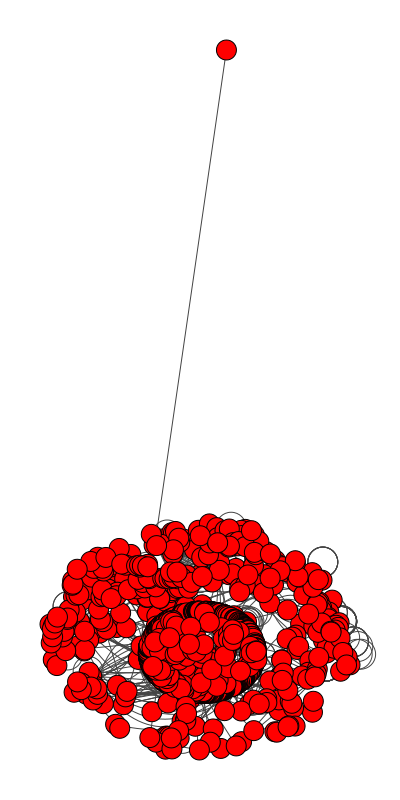

In [163]:
#layout = g.layout_kamada_kawai()
plot(g, layout = layout, bbox = (400,800), margin = 50)